 # ANALYSIS OF CRIMES IN BOSTON DATASET

## Imports

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## Reading Data

Data is in .csv format. I have used read_csv in pandas to read data and save them into a data frame. And I have checked if data is loaded succesfully

In [ ]:
df=pd.read_csv('/content/crime.csv', encoding = "ISO-8859-1")
df.head()

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182080058,2403,Disorderly Conduct,DISTURBING THE PEACE,E18,495,NaN,2018-10-03 20:13:00,2018,10,Wednesday,20,Part Two,ARLINGTON ST,42.262608,-71.121186,"(42.26260773, -71.12118637)"
1,I182080053,3201,Property Lost,PROPERTY - LOST,D14,795,NaN,2018-08-30 20:00:00,2018,8,Thursday,20,Part Three,ALLSTON ST,42.352111,-71.135311,"(42.35211146, -71.13531147)"
2,I182080052,2647,Other,THREATS TO DO BODILY HARM,B2,329,NaN,2018-10-03 19:20:00,2018,10,Wednesday,19,Part Two,DEVON ST,42.308126,-71.076930,"(42.30812619, -71.07692974)"
3,I182080051,413,Aggravated Assault,ASSAULT - AGGRAVATED - BATTERY,A1,92,NaN,2018-10-03 20:00:00,2018,10,Wednesday,20,Part One,CAMBRIDGE ST,42.359454,-71.059648,"(42.35945371, -71.05964817)"
4,I182080050,3122,Aircraft,AIRCRAFT INCIDENTS,A7,36,NaN,2018-10-03 20:49:00,2018,10,Wednesday,20,Part Three,PRESCOTT ST,42.375258,-71.024663,"(42.37525782, -71.02466343)"


### Understanding Data

In [ ]:
df.shape

(327820, 17)

In [ ]:
df.columns

Index(['INCIDENT_NUMBER', 'OFFENSE_CODE', 'OFFENSE_CODE_GROUP',
       'OFFENSE_DESCRIPTION', 'DISTRICT', 'REPORTING_AREA', 'SHOOTING',
       'OCCURRED_ON_DATE', 'YEAR', 'MONTH', 'DAY_OF_WEEK', 'HOUR', 'UCR_PART',
       'STREET', 'Lat', 'Long', 'Location'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 327820 entries, 0 to 327819
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   INCIDENT_NUMBER      327820 non-null  object 
 1   OFFENSE_CODE         327820 non-null  int64  
 2   OFFENSE_CODE_GROUP   327820 non-null  object 
 3   OFFENSE_DESCRIPTION  327820 non-null  object 
 4   DISTRICT             326046 non-null  object 
 5   REPORTING_AREA       327820 non-null  object 
 6   SHOOTING             1055 non-null    object 
 7   OCCURRED_ON_DATE     327820 non-null  object 
 8   YEAR                 327820 non-null  int64  
 9   MONTH                327820 non-null  int64  
 10  DAY_OF_WEEK          327820 non-null  object 
 11  HOUR                 327820 non-null  int64  
 12  UCR_PART             327727 non-null  object 
 13  STREET               316843 non-null  object 
 14  Lat                  307188 non-null  float64
 15  Long             

In [ ]:
df.isnull().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP          0
OFFENSE_DESCRIPTION         0
DISTRICT                 1774
REPORTING_AREA              0
SHOOTING               326765
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART                   93
STREET                  10977
Lat                     20632
Long                    20632
Location                    0
dtype: int64

# Q1. How has crime changed over the years?

Dataset contains crime data from 2015 to 2018. If you look at the number of crimes, you can see that 2016 has a sharp increase from 2015 and gradually decreasing by 2018. When I considered that increasing, I need to be sure that the dataset has all the crime records that have commited in 2015 and 2018. 

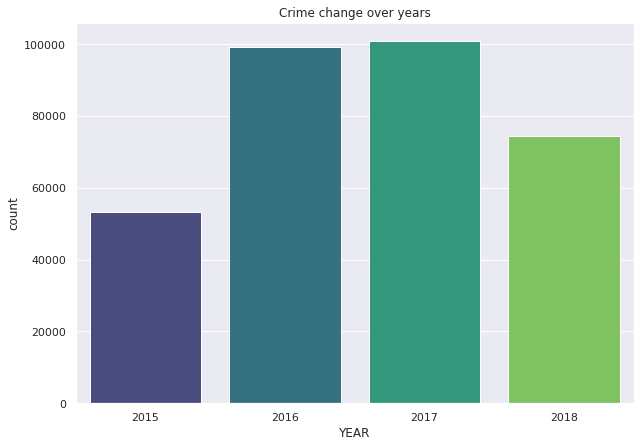

In [ ]:
plt.figure(figsize=(10,7))
plt.title("Crime change over years")
sns.countplot(x=df['YEAR'],palette='viridis')


To be sure that, I wrote the code below to get first month values of the years. 

According to the graph below, 2015 crime data starts with June. That means 2015 has only 7 months. This kind of explains why 2015 was almost half of the 2016 and 2018. Therefore I cannot say for sure that crimes committed in 2015 are less than other years.  

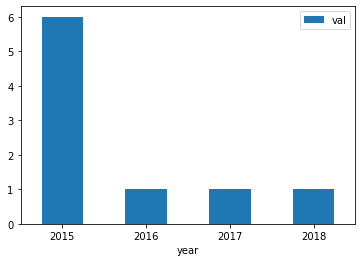

In [ ]:
from datetime import datetime
df_2015 = df.loc[df['YEAR'] == 2015]
df_2016 = df.loc[df['YEAR'] == 2016]
df_2017 = df.loc[df['YEAR'] == 2017]
df_2018 = df.loc[df['YEAR'] == 2018]
    
df_start_month = pd.DataFrame({'year':['2015', '2016', '2017', '2018'], 'val':[min(df_2015['MONTH']), min(df_2016['MONTH']), min(df_2017['MONTH']), min(df_2018['MONTH'])]})
ax = df_start_month.plot.bar(x='year', y='val', rot=0)
plt.show()

According to the graph below, 2018 crime data ends with October. It has only 10 months. This might caused to the decreasement from 2017 in the crime change over years graph.

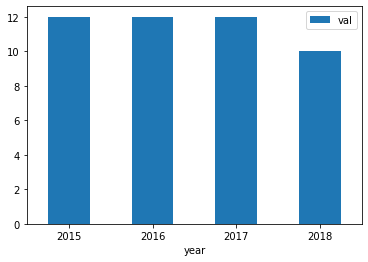

In [ ]:
df_end_month = pd.DataFrame({'year':['2015', '2016', '2017', '2018'], 'val':[max(df_2015['MONTH']), max(df_2016['MONTH']), max(df_2017['MONTH']), max(df_2018['MONTH'])]})
ax = df_end_month.plot.bar(x='year', y='val', rot=0)
plt.show()

To overcome that missing data problem, I have found the monthly average incident per year by dividing count of incident to number of months for each year. 

In [ ]:
avg_months = (df.groupby('YEAR').count()['INCIDENT_NUMBER'] / df.groupby('YEAR')['MONTH'].nunique()).to_frame().reset_index()
avg_months.columns = ['YEAR', 'COUNT']
avg_months

,YEAR,COUNT
0,2015,7627.428571
1,2016,8261.166667
2,2017,8411.500000
3,2018,7435.600000


As you can see, there actually isn't much change when I get the average of months. There is an increase from 2015 to 2016 and a little increase as well from 2016 to 2017 and finally a decrease from 2017 to 2018.

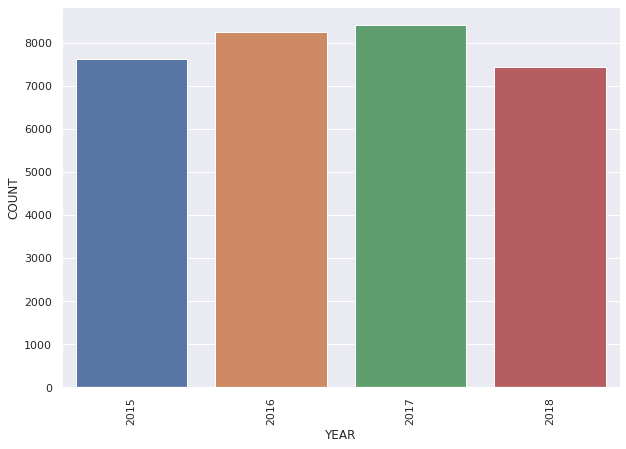

In [ ]:
ax = sns.barplot(x = 'YEAR' , y="COUNT", data = avg_months)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

There seems to be more crimes during the summer months (rising quickly from May to June, then reaching a high at July and August). Soon after, it drops. A worthy explanation is the temperature difference - the warmer months encourage crime more than colder months.

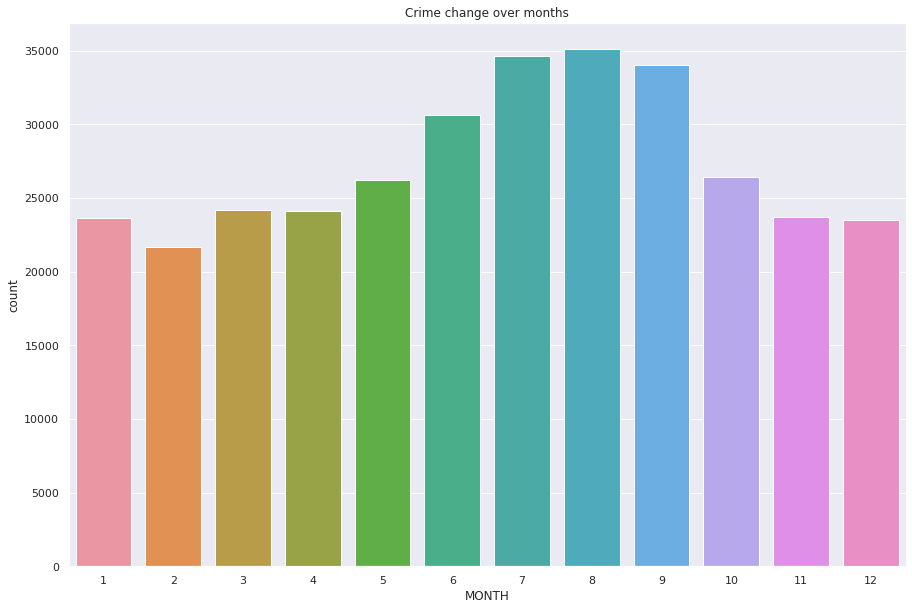

In [ ]:
plt.figure(figsize=(15,10))
plt.title("Crime change over months")
sns.countplot(x="MONTH", data=df)

But, there might be missing data in 2015 and 2018. Because I don't know the number of days in June of 2015 and October of 2018. To find out that, it would be useful to get the minimum and maximum dates in the crime dataset. 

In [ ]:
print(df.min()['OCCURRED_ON_DATE'])
print(df.max()['OCCURRED_ON_DATE'])

2015-06-15 00:00:00
2018-10-03 20:49:00


To fill missing days of June 2015 and October 2018, the code below gets the average daily incidents.

In [ ]:
avg_2015 = d_avg.counts[0]
avg_2018 = d_avg.counts[3]
count_2015 = len(df.loc[df['YEAR'] == 2015])/12
count_2018 = len(df.loc[df['YEAR'] == 2018])/12
numberOfIncidentsFor2015 = (15*avg_2015) + count_2015
numberOfIncidentsFor2018 = (27*avg_2018) + count_2018

## Shooting

In [ ]:
df.fillna('N', inplace=True)
shootings = df.loc[df['SHOOTING'] == 'Y']

As you can see the graph below, shootings increase from 2015 to 2016 and from 2016 to 2017 and then there is a decrease from 2017 to 2018. The increase from 2016 to 2017 is clear as both years are completed

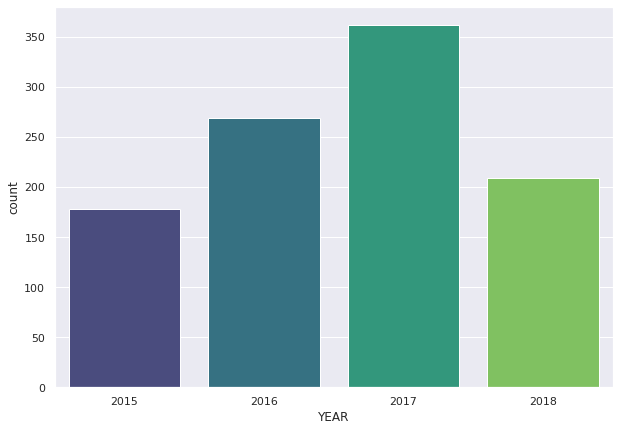

In [ ]:
sns.set(rc={'figure.figsize':(10,7)})
sns.countplot(x=shootings['YEAR'],palette='viridis')

## Crimes by Seasons

To obtain crime counts by seasons, I defined the 'get_season' function below.

In [ ]:
def get_season(month):
    if month in [12,1,2]:
        return "Winter"
    elif month in [3,4,5]:
        return "Spring"
    elif month in [9,10,11]:
        return "Autumn"
    else:
        return "Summer"

In [ ]:
df['Season'] = df["MONTH"].apply(lambda x: get_season(x))
spring_count = df.loc[df['Season'] == 'Spring'].count()
autumn_count = df.loc[df['Season'] == 'Autumn'].count()
summer_count = df.loc[df['Season'] == 'Summer'].count()
winter_count = df.loc[df['Season'] == 'Winter'].count()


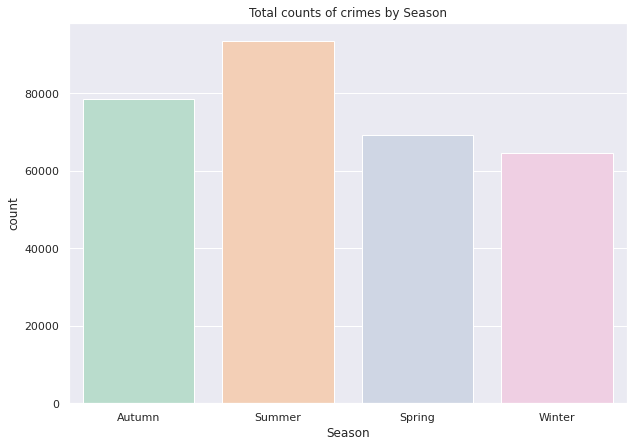

In [ ]:
plt.figure(figsize=(10,7))
plt.title("Total counts of crimes by Season")
sns.countplot(x="Season", data=df, palette="Pastel2")

# Q2. Is it possible to predict where or when a crime will be committed? 

## a-) When a crime will be committed?

 

When we looked at the columns of the dataset, it can be said that 'OCCURRED_ON_DATE', 'YEAR', 'MONTH', 'DAY_OF_WEEK', 'HOUR' columns are related with the 'when' part of the question.
It is possible to make predictions about when a crime will be committed based on the these time-related columns with implementation of Time Series and other Machine Learnig prediction methods.


Because of we have not completed ML trainings yet and this case does not include using these methods, I will try to predict the likeliness of the incident happening for the hours scope. 

In [ ]:
df.columns 

Index(['INCIDENT_NUMBER', 'OFFENSE_CODE', 'OFFENSE_CODE_GROUP',
       'OFFENSE_DESCRIPTION', 'DISTRICT', 'REPORTING_AREA', 'SHOOTING',
       'OCCURRED_ON_DATE', 'YEAR', 'MONTH', 'DAY_OF_WEEK', 'HOUR', 'UCR_PART',
       'STREET', 'Lat', 'Long', 'Location', 'Season'],
      dtype='object')

In [ ]:
df['OCCURRED_ON_DATE'] = pd.to_datetime(df['OCCURRED_ON_DATE'])


## When do crimes occur?

### Crimes for each month

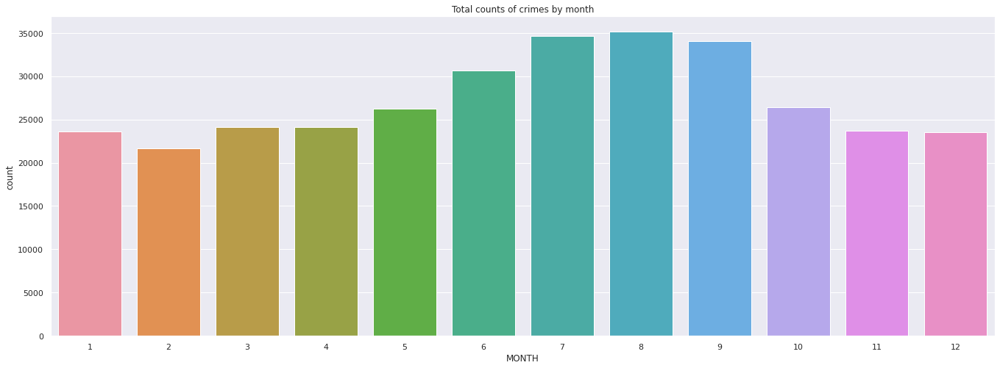

In [ ]:
plt.title("Total counts of crimes by month")
sns.countplot(x="MONTH", data=df)

### Crimes for each day of week

We can see that crime remains pretty consistent across the week, peaking (but not too much) on Friday, and reaching to minimum on Sunday. Crime might be lower on Sunday because of people go to church. 

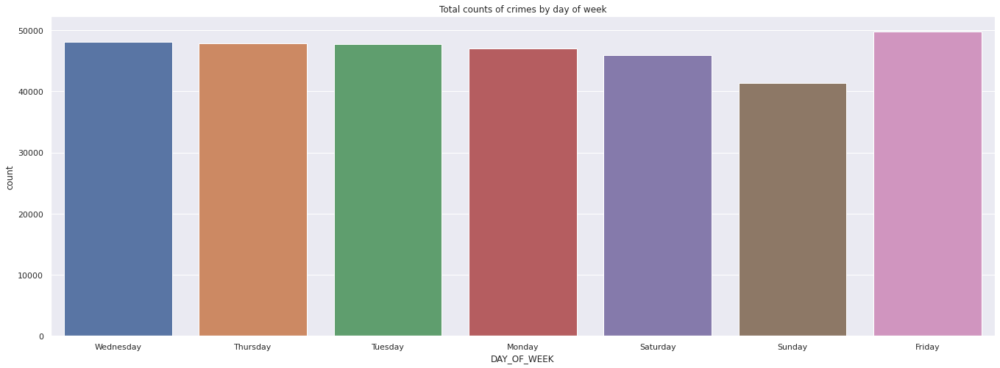

In [ ]:
plt.title("Total counts of crimes by day of week")
sns.countplot(x="DAY_OF_WEEK", data=df)

### Crimes for each hour 

Let's get the count of incidents for each hour. 

In [ ]:
hourly_counts = df.groupby('HOUR').size().reset_index(name = 'Count')

In the early hours of the morning, crime quickly drops and reaches to minimum at 4 or 5 AM, then rising and reaching a local minimum at noon and peaking at 5 PM. What is interesting is the sudden jump from the 23rd hour to the 24th/0th hour in crimes.



Also, it is interesting that there appears to be more crimes committed during daylight than at night.

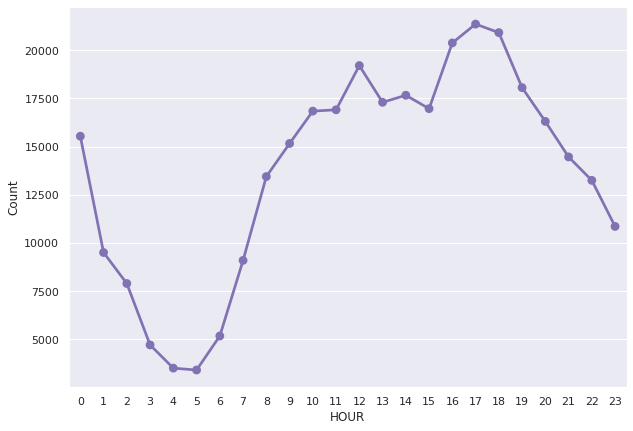

In [ ]:
plt.figure(figsize=(10,7))
sns.pointplot(data = hourly_counts, x = 'HOUR', y = 'Count', color='m')
plt.show()

Let's check crimes comitted for each day and night

In [ ]:
def day_or_night(hour):
    if hour>6 and hour<19:
        return 'Day'
    else:
        return 'Night'
df['DAY_OR_NIGHT'] = df['HOUR'].apply(day_or_night)

Now, it is confirmed that more crimes are done during the day than at night.

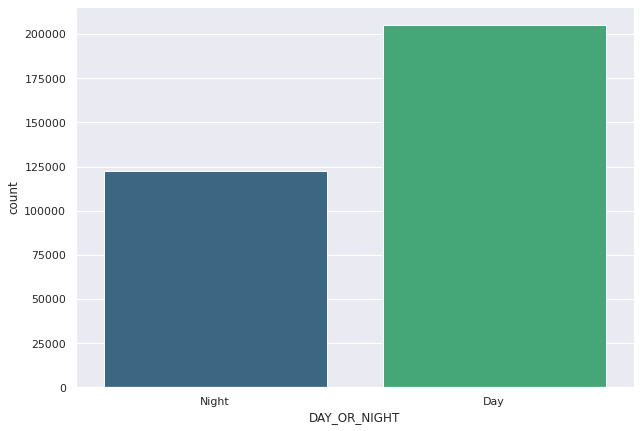

In [ ]:
sns.countplot(x=df['DAY_OR_NIGHT'],palette='viridis')

### Crimes per each year each hour

In [ ]:
plt.figure(figsize=(15,8))
df_year_hour = df.groupby(['YEAR','HOUR']).size().reset_index()
df_year_hour.columns = [['Year','Hour', 'Count']]
df_year_hour

,Year,Hour,Count
0,2015,0,2752
1,2015,1,1643
2,2015,2,1330
3,2015,3,803
4,2015,4,539
...,...,...,...
91,2018,19,3977
92,2018,20,3763
93,2018,21,3284
94,2018,22,2909


<Figure size 1080x576 with 0 Axes>

In [ ]:
plt.figure(figsize=(15,8))
df_season_hour = df.groupby(['Season','HOUR']).size().reset_index()
df_season_hour.columns = [['Season','Hour', 'Count']]
df_season_hour

,Season,Hour,Count
0,Autumn,0,3958
1,Autumn,1,2503
2,Autumn,2,1968
3,Autumn,3,1175
4,Autumn,4,918
...,...,...,...
91,Winter,19,3730
92,Winter,20,3393
93,Winter,21,2953
94,Winter,22,2646


<Figure size 1080x576 with 0 Axes>

In [ ]:
df.groupby(['YEAR','MONTH', df.OCCURRED_ON_DATE.dt.day, 'HOUR']).count()['INCIDENT_NUMBER'].sort_values(ascending = False).to_frame()

INCIDENT_NUMBER
YEAR MONTH OCCURRED_ON_DATE HOUR                 
2015 6     18               5                  60
2017 2     24               17                 43
2016 8     10               18                 41
     1     1                0                  40
2017 2     17               17                 40
...                                           ...
2015 11    25               3                   1
     7     14               3                   1
2018 2     12               4                   1
2016 6     7                2                   1
     1     27               3                   1

[28565 rows x 1 columns]

In [ ]:
df.groupby(['Season', 'HOUR']).count()['INCIDENT_NUMBER'].sort_values(ascending = False).to_frame()

INCIDENT_NUMBER
Season HOUR                 
Summer 17               6562
       18               6387
       16               5902
       12               5859
Autumn 17               5513
...                      ...
       5                 882
Spring 4                 781
       5                 737
Winter 5                 720
       4                 711

[96 rows x 1 columns]

With analyzing the data, we see how many incidents are reported per year, per month, per day o week, per hour, average monthly incidents through all years, monthly incident counts for each year, hourly crime incidents for each year and hourly crime incidents for each season.

With these information and implementing some prediction models of Machine Learning, we can predict when a crime will be commited. 

## b-) Where a crime will be committed?

When you looked at the columns of the dataset, it can be said that 'DISTRICT', 'STREET', 'Lat', 'Long' -> 'Location' columns are related with the 'where' part of the question.
It is possible to make predictions about where a crime will be committed based on the these locational columns.

### Crimes by District

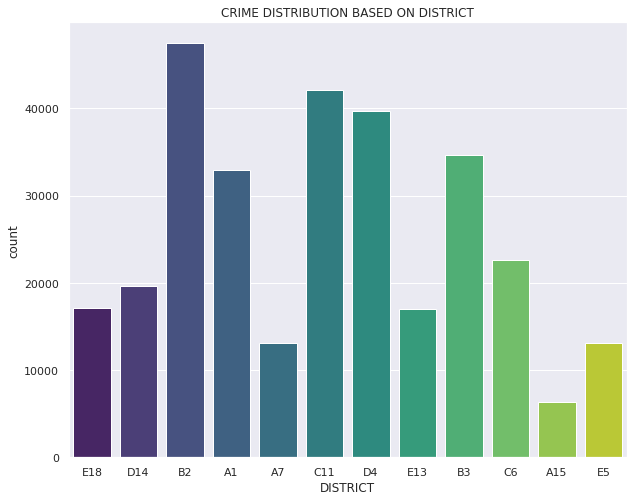

In [ ]:
fig = plt.figure(figsize=(10,8))
plt.title('CRIME DISTRIBUTION BASED ON DISTRICT')
sns.countplot(x=df['DISTRICT'],palette='viridis')

### Crimes by Street

We have 4684 different streets.

In [ ]:
df.STREET.describe()

count            316843
unique             4684
top       WASHINGTON ST
freq              14590
Name: STREET, dtype: object

Top 10 Streets

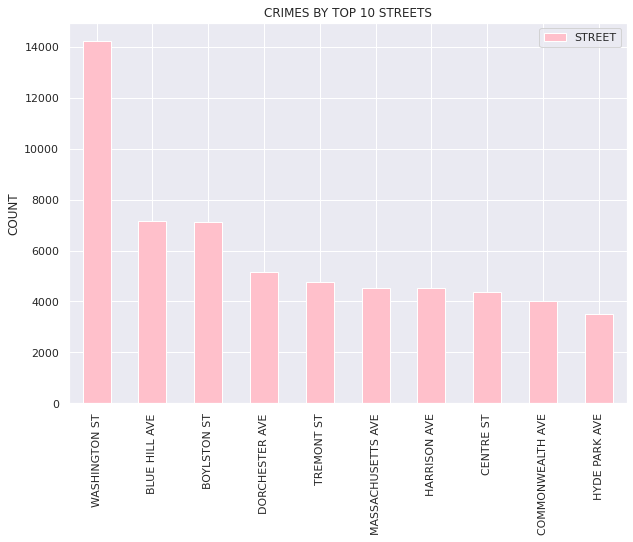

In [ ]:
plt.title('CRIMES BY TOP 10 STREETS')
plt.ylabel('COUNT')
df['STREET'].value_counts()[:10].plot(kind='bar', color='pink')
plt.legend()
plt.show()

Let's see how many street each district has. 

In [ ]:
df.groupby('DISTRICT')['STREET'].nunique().sort_values(ascending = False).to_frame()

,STREET
DISTRICT,
B2,683
C11,650
E5,527
E18,445
B3,441
D14,429
A1,419
E13,390
C6,371



### Crimes by Location

We have 18255 different locations.

In [ ]:
df.Location.describe()

count                       327820
unique                       18255
top       (0.00000000, 0.00000000)
freq                         20632
Name: Location, dtype: object

Let's see how many unique location each district has. 

In [ ]:
df.groupby('DISTRICT')['Location'].nunique().sort_values(ascending = False).to_frame()

,Location
DISTRICT,
C11,2381
B2,2357
E5,1710
D14,1617
B3,1605
C6,1536
E18,1490
D4,1452
A1,1446


### Crimes by Reporting Area

We have 880 different reporting areas. With this information, we can say that districts might have more than one reporting area. 

In [ ]:
df.REPORTING_AREA.describe()

count     327820
unique       880
top             
freq       20920
Name: REPORTING_AREA, dtype: object

Let's see how many unique reporting area each district has. 

In [ ]:
df.groupby('DISTRICT')['REPORTING_AREA'].nunique().sort_values(ascending = False).to_frame()

,REPORTING_AREA
DISTRICT,
B2,166
C11,161
E5,124
D4,116
B3,116
A1,116
E18,94
E13,94
C6,86


We got number of crimes by each district, by reporting areas per district, unique street counts and street counts per district, location count and location count per district.

With these information and implementing some prediction models of Machine Learning (Time Series would be a perfect choice if dates are continuous), it is possible to predict where a crime will be commited.

# Q3. What can you say about the distribution of different offenses over the city?

## Offenses

As you can see there are 67 different offense code groups. 

[Text(0, 0, 'Motor Vehicle Accident Response'),
 Text(0, 0, 'Larceny'),
 Text(0, 0, 'Medical Assistance'),
 Text(0, 0, 'Investigate Person'),
 Text(0, 0, 'Other'),
 Text(0, 0, 'Drug Violation'),
 Text(0, 0, 'Simple Assault'),
 Text(0, 0, 'Vandalism'),
 Text(0, 0, 'Verbal Disputes'),
 Text(0, 0, 'Towed'),
 Text(0, 0, 'Investigate Property'),
 Text(0, 0, 'Larceny From Motor Vehicle'),
 Text(0, 0, 'Property Lost'),
 Text(0, 0, 'Warrant Arrests'),
 Text(0, 0, 'Aggravated Assault'),
 Text(0, 0, 'Violations'),
 Text(0, 0, 'Fraud'),
 Text(0, 0, 'Residential Burglary'),
 Text(0, 0, 'Missing Person Located'),
 Text(0, 0, 'Auto Theft'),
 Text(0, 0, 'Robbery'),
 Text(0, 0, 'Harassment'),
 Text(0, 0, 'Property Found'),
 Text(0, 0, 'Missing Person Reported'),
 Text(0, 0, 'Confidence Games'),
 Text(0, 0, 'Police Service Incidents'),
 Text(0, 0, 'Disorderly Conduct'),
 Text(0, 0, 'Fire Related Reports'),
 Text(0, 0, 'Firearm Violations'),
 Text(0, 0, 'License Violation'),
 Text(0, 0, 'Restraining Ord

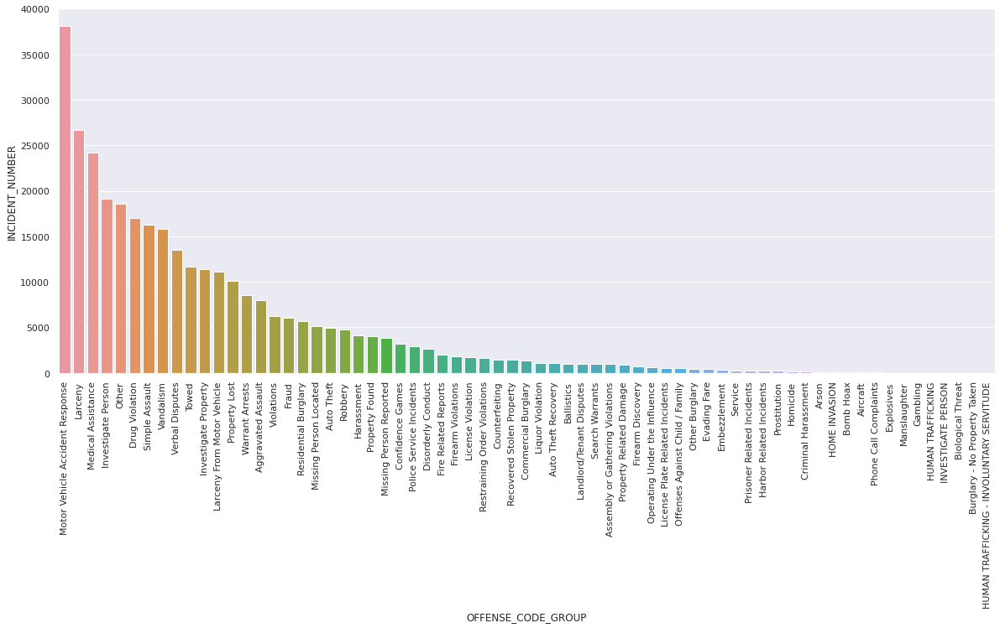

In [ ]:
offenses = df.groupby('OFFENSE_CODE_GROUP')['INCIDENT_NUMBER'].count().sort_values(ascending = False).to_frame()
offenses.reset_index(inplace = True)
sns.set(rc={'figure.figsize':(23,8)})
plt.figure(figsize=(20,8))
ax = sns.barplot(x="OFFENSE_CODE_GROUP", y="INCIDENT_NUMBER", data=offenses)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)

## UCR Part

We can see that UCR_PART is a classification of crimes called the Uniform Crime Reporting standard. Part One crimes are considered to be more severe, Part Two are less severe. 

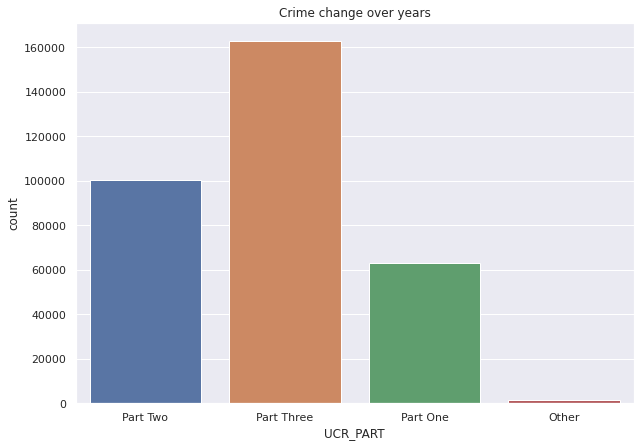

In [ ]:
plt.figure(figsize=(10,7))
plt.title("Crime change over years")
sns.countplot(x="UCR_PART", data=df)

We can see that Part Three offenses are not severe crimes or even crimes at all — motor vehicle accidents, medical assistance, other, etc. 

In [ ]:
df[df["UCR_PART"]=='Part Three'].OFFENSE_CODE_GROUP.unique()

array(['Property Lost', 'Aircraft', 'Motor Vehicle Accident Response',
       'Verbal Disputes', 'Towed', 'Medical Assistance',
       'Investigate Person', 'Fire Related Reports',
       'Investigate Property', 'Warrant Arrests', 'Property Found',
       'Missing Person Reported', 'Landlord/Tenant Disputes', 'Other',
       'Missing Person Located', 'License Plate Related Incidents',
       'Property Related Damage', 'Police Service Incidents',
       'License Violation', 'Assembly or Gathering Violations',
       'Search Warrants', 'Firearm Discovery', 'Harbor Related Incidents',
       'Service', 'Explosives', 'Prisoner Related Incidents'],
      dtype=object)

To manage different offenses, I will analyse the distribution of different offenses over the city by :

1.   Part One
2.   Part Two
3.   Part Three
4.   Shooting


## 1-) Serious (Part One) Crimes Distribution Over the City

As you can see while Larceny is by far the largest group of crimes, Homicide is the least one in the Part One classification.

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 <a list of 9 Text major ticklabel objects>)

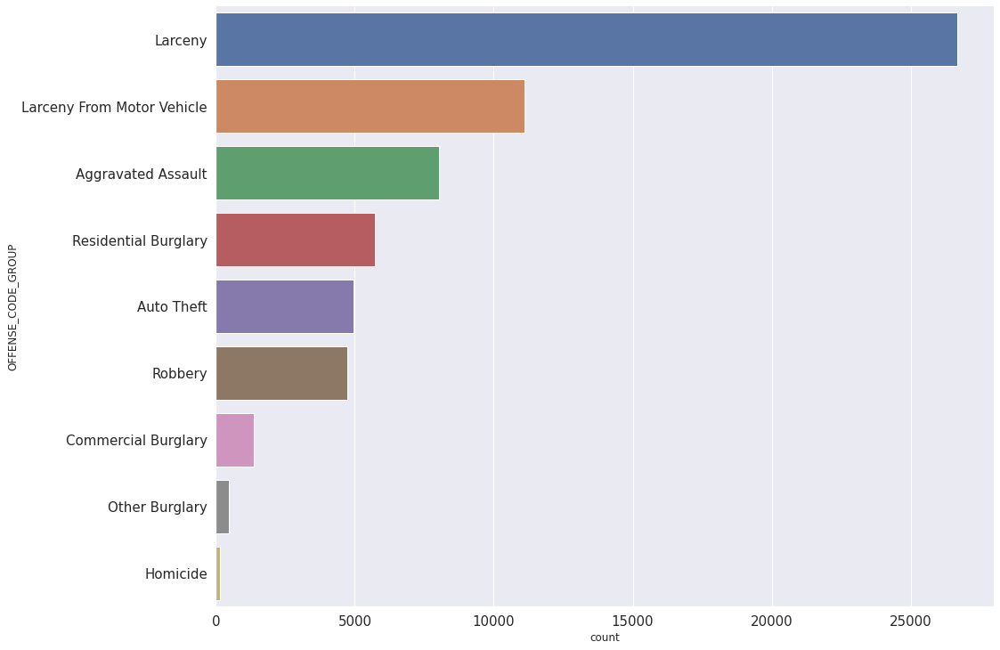

In [ ]:
serious_crimes = df[df["UCR_PART"]=='Part One']
sns.catplot(y='OFFENSE_CODE_GROUP', kind='count', height=10, aspect=1.5, order=serious_crimes.OFFENSE_CODE_GROUP.value_counts().index,  data=serious_crimes)
plt.xticks(size=15)
plt.yticks(size=15)


To avoid NaN or null values, I filtered data as you can see below.


In [ ]:
serious_crimes = serious_crimes.loc[serious_crimes['DISTRICT'] != 'N']
serious_crimes = serious_crimes.loc[serious_crimes['DISTRICT'].isnull() != True]
serious_crimes = serious_crimes.loc[serious_crimes['Lat'] != 'N']
serious_crimes = serious_crimes.loc[serious_crimes['Long'] != 'N']

/usr/local/lib/python3.6/dist-packages/pandas/core/ops/array_ops.py:253: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  res_values = method(rvalues)


Let's see the distribution of Larceny which is the most commited crime in Part One Category.

In [ ]:
larceny = df[df["OFFENSE_CODE_GROUP"]=='Larceny']
larceny['count'] = larceny.groupby('Location')['Location'].transform('count')
larceny.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,Season,count
21,I182080029,613,Larceny,LARCENY SHOPLIFTING,D4,146,NaN,2018-10-03 19:09:00,2018,10,Wednesday,19,Part One,HUNTINGTON AVE,42.347972,-71.078496,"(42.34797240, -71.07849582)",Autumn,254
24,I182080027,619,Larceny,LARCENY ALL OTHERS,B2,294,NaN,2018-10-03 18:53:00,2018,10,Wednesday,18,Part One,AKRON ST,42.325794,-71.085638,"(42.32579408, -71.08563758)",Autumn,4
47,I182080003,613,Larceny,LARCENY SHOPLIFTING,C6,214,NaN,2018-10-03 17:45:00,2018,10,Wednesday,17,Part One,W BROADWAY,42.336112,-71.046654,"(42.33611200, -71.04665434)",Autumn,45
54,I182079994,619,Larceny,LARCENY ALL OTHERS,A1,67,NaN,2018-10-03 16:49:00,2018,10,Wednesday,16,Part One,CAMBRIDGE ST,42.361110,-71.067414,"(42.36110964, -71.06741369)",Autumn,5
56,I182079991,617,Larceny,LARCENY THEFT FROM BUILDING,C6,915,NaN,2018-09-25 11:00:00,2018,9,Tuesday,11,Part One,REV RICHARD A BURKE ST,42.331920,-71.052108,"(42.33191971, -71.05210788)",Autumn,1


In [ ]:
import plotly.express as px
fig = px.density_mapbox(larceny, lat='Lat', lon='Long', z='count', radius=10,
                        center=dict(lat=42.357791, lon=-71), zoom=10,
                        mapbox_style="stamen-terrain")
fig.show()

### Distributions of Serious Crimes Over the City with Interactive Map

According to the interactive map of the different crimes below, the first thing I can is that Commercial Burglary has committed more frequently south of the Boston. Secondly, when I consider about the most frequent crimes which are Larceny and Larceny Motor Vehicle, they both spread all over the city except southern west.
Actually, I realised that all the crime types have less density in southern west where E5 district is located. This might be caused by low population or low income neighborhood in this area.

In [ ]:
import plotly.express as px
fig = px.scatter_mapbox(serious_crimes, lat="Lat", lon="Long", color="OFFENSE_CODE_GROUP", zoom=10, mapbox_style='open-street-map')
fig.show()


### By District

According to the chart below, it is clear that frequency of D4 is significantly higher than the other districts, with A15 experiencing the least incidents.

([<matplotlib.patches.Wedge at 0x7fe8467484e0>,
 [Text(0.996440317570754, 0.4659470930475854, 'A1'),
  Text(0.6505637859725643, 0.8869987375306932, 'A15'),
  Text(0.4856514835002055, 0.9869866445773468, 'A7'),
  Text(-0.11455218336364456, 1.0940191027978543, 'B2'),
  Text(-0.7966519599267828, 0.7585154281521344, 'B3'),
  Text(-1.0859161159183477, 0.17545993613588773, 'C11'),
  Text(-1.006244279691072, -0.4443787231506429, 'C6'),
  Text(-0.726618714121607, -0.8258481968789801, 'D14'),
  Text(0.12839718518988832, -1.092480737969926, 'D4'),
  Text(0.8851951665601311, -0.6530157096874332, 'E13'),
  Text(1.0434016618795032, -0.34830011769606223, 'E18'),
  Text(1.0950369502171837, -0.10437469836626757, 'E5')])

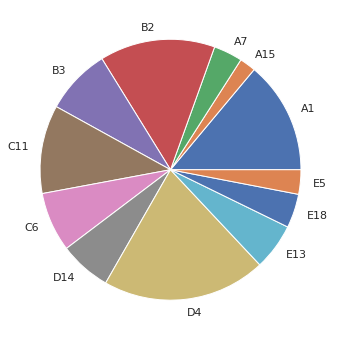

In [ ]:
from matplotlib.pyplot import pie
dis_counts = serious_crimes.groupby('DISTRICT').count()['INCIDENT_NUMBER']
plt.figure(figsize=(12,6))
pie(dis_counts, labels = dis_counts.index)

### Top 10 Streets

According to the chart below, 
it can be said that the most dangerous streets are Washington St. and Boylston St.


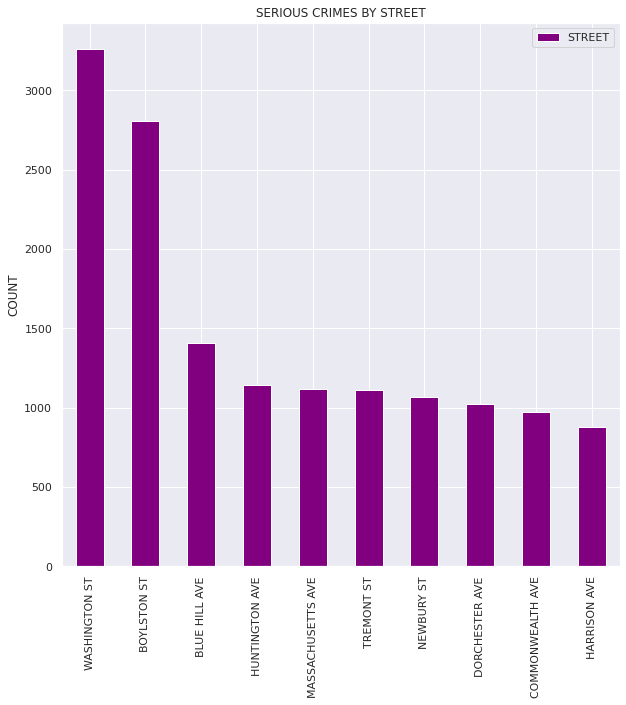

In [ ]:
fig = plt.figure(figsize=(10,10))
plt.title('SERIOUS CRIMES BY STREET')
plt.ylabel('COUNT')
serious_crimes['STREET'].value_counts()[:10].plot(kind='bar', color='purple')
plt.legend()
plt.show()

## 2-) Less Serious (Part Two) Crimes Distribution Over the City

In [ ]:
part_two_crimes = df[df["UCR_PART"]=='Part Two']
part_two_crimes.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,Season
0,I182080058,2403,Disorderly Conduct,DISTURBING THE PEACE,E18,495,NaN,2018-10-03 20:13:00,2018,10,Wednesday,20,Part Two,ARLINGTON ST,42.262608,-71.121186,"(42.26260773, -71.12118637)",Autumn
2,I182080052,2647,Other,THREATS TO DO BODILY HARM,B2,329,NaN,2018-10-03 19:20:00,2018,10,Wednesday,19,Part Two,DEVON ST,42.308126,-71.076930,"(42.30812619, -71.07692974)",Autumn
5,I182080049,1402,Vandalism,VANDALISM,C11,351,NaN,2018-10-02 20:40:00,2018,10,Tuesday,20,Part Two,DORCHESTER AVE,42.299197,-71.060470,"(42.29919694, -71.06046974)",Autumn
8,I182080045,802,Simple Assault,ASSAULT SIMPLE - BATTERY,E18,543,NaN,2018-10-03 19:27:51,2018,10,Wednesday,19,Part Two,AVILA RD,42.256145,-71.128025,"(42.25614494, -71.12802506)",Autumn
16,I182080037,2647,Other,THREATS TO DO BODILY HARM,C11,385,NaN,2018-10-03 18:35:00,2018,10,Wednesday,18,Part Two,HALLET ST,42.280767,-71.047365,"(42.28076737, -71.04736497)",Autumn


As you can see Other, Drug Violation, Simple Assault and Vandalism are by far the larger than other groups of crimes in the Part Two classification.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]),
 <a list of 29 Text major ticklabel objects>)

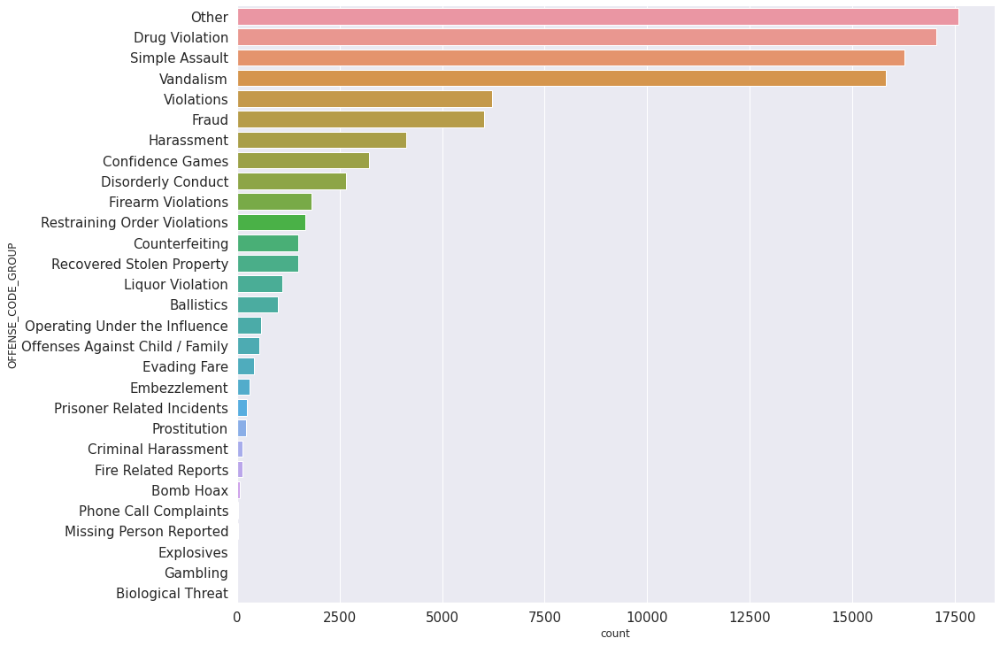

In [ ]:
sns.catplot(y='OFFENSE_CODE_GROUP', kind='count', height=10, aspect=1.5, order=part_two_crimes.OFFENSE_CODE_GROUP.value_counts().index,  data=part_two_crimes)
plt.xticks(size=15)
plt.yticks(size=15)

To avoid NaN or null values, I filtered the data like serious crimes as you can see below.

In [ ]:
part_two_crimes = part_two_crimes.loc[part_two_crimes['DISTRICT'] != 'N']
part_two_crimes = part_two_crimes.loc[part_two_crimes['DISTRICT'].isnull() != True]
part_two_crimes = part_two_crimes.loc[part_two_crimes['Lat'] != 'N']
part_two_crimes = part_two_crimes.loc[part_two_crimes['Long'] != 'N']

/usr/local/lib/python3.6/dist-packages/pandas/core/ops/array_ops.py:253: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



## Density Map of Less Serious Crimes

In [ ]:
part_two_crimes['count'] = part_two_crimes.groupby('Location')['Location'].transform('count')

In [ ]:
import plotly.express as px
fig = px.density_mapbox(part_two_crimes, lat='Lat', lon='Long', z='count', radius=10,
                        center=dict(lat=42.357791, lon=-71), zoom=10,
                        mapbox_style="stamen-terrain")
fig.show()

## Distributions of Part Two Crimes Over the City with Interactive Map

In [ ]:
import plotly.express as px
fig = px.scatter_mapbox(part_two_crimes, lat="Lat", lon="Long", color="OFFENSE_CODE_GROUP", zoom=10, mapbox_style='open-street-map')
fig.show()

### By District

As you can see, it is clear that count of the art two crimes commited in D4 is significantly higher than the other districts, with A15 experiencing the least crimes.


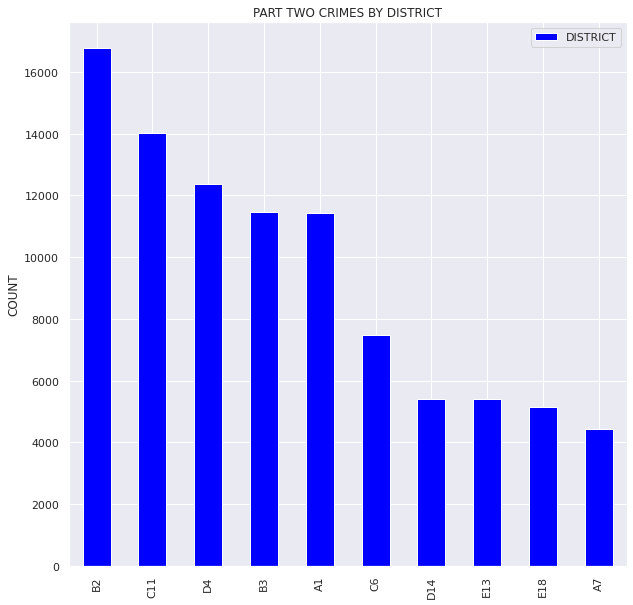

In [ ]:
fig = plt.figure(figsize=(10,10))
plt.title('PART TWO CRIMES BY DISTRICT')
plt.ylabel('COUNT')
part_two_crimes['DISTRICT'].value_counts()[:10].plot(kind='bar', color='blue')
plt.legend()
plt.show()

### Top 10 Streets

According to the chart below, it can be said that Washington St. is the street where part two crimes commited mostly. 

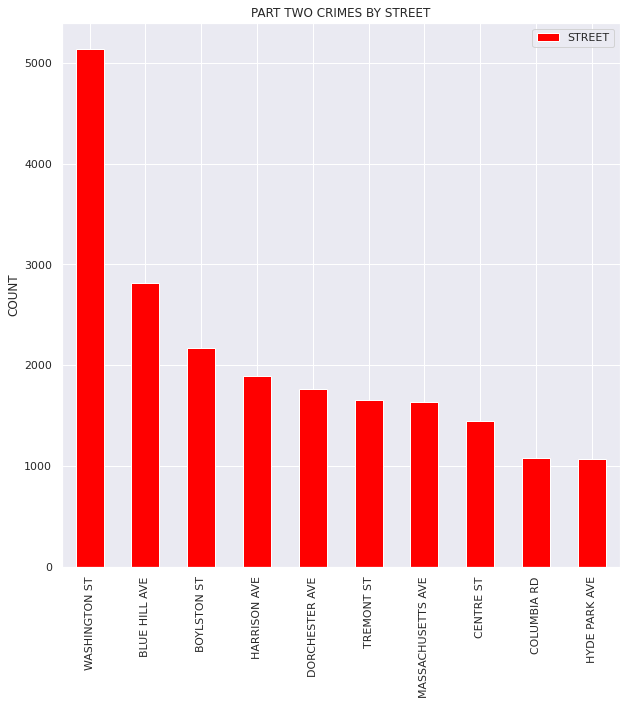

In [ ]:
fig = plt.figure(figsize=(10,10))
plt.title('PART TWO CRIMES BY STREET')
plt.ylabel('COUNT')
part_two_crimes['STREET'].value_counts()[:10].plot(kind='bar', color='red')
plt.legend()
plt.show()

## 3-) Part Three Offenses Distribution Over the City

In [ ]:
part_three = df[df["UCR_PART"]=='Part Three']

According to the part three offenses, Motor Vehicle Accident Response and Medical Assistance are the most common offenses. 

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25]),
 <a list of 26 Text major ticklabel objects>)

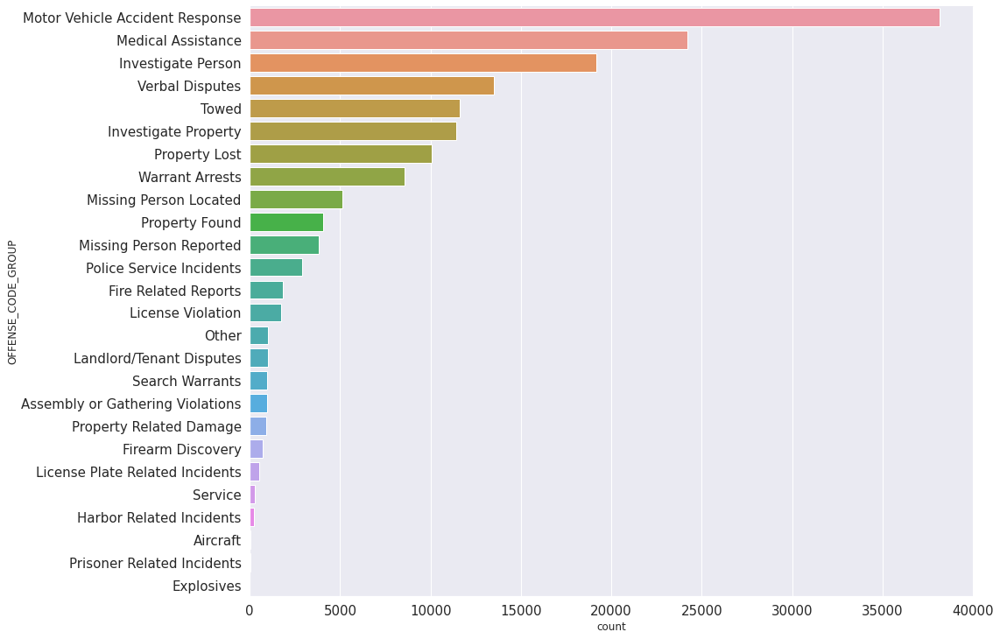

In [ ]:
sns.catplot(y='OFFENSE_CODE_GROUP', kind='count', height=10, aspect=1.5, order=part_three.OFFENSE_CODE_GROUP.value_counts().index,  data=part_three)
plt.xticks(size=15)
plt.yticks(size=15)

To avoid NaN or null values, I filtered data as you can see below.

In [ ]:
part_three = part_three.loc[part_three['DISTRICT'] != 'N']
part_three = part_three.loc[part_three['DISTRICT'].isnull() != True]
part_three = part_three.loc[part_three['Lat'] != 'N']
part_three = part_three.loc[part_three['Long'] != 'N']


/usr/local/lib/python3.6/dist-packages/pandas/core/ops/array_ops.py:253: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



## Distributions of Motor Vehicle Accident Response and Medical Assistance

In [ ]:
motor_vehicle_accident = part_three[part_three["OFFENSE_CODE_GROUP"]=='Motor Vehicle Accident Response']
medical_assistance = part_three[part_three["OFFENSE_CODE_GROUP"]=='Medical Assistance']

In [ ]:
motor_vehicle_accident['count'] = motor_vehicle_accident.groupby('Location')['Location'].transform('count')
medical_assistance['count'] = medical_assistance.groupby('Location')['Location'].transform('count')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



As you can see on the map, the most Motor Vehicle Accidents were happened in the areas of Clifford Playground. It would be useful to place more traffic lights in such areas where Motor Vehicle Accident counts are more than 5. 

In [ ]:
import plotly.express as px
fig = px.density_mapbox(motor_vehicle_accident, lat='Lat', lon='Long', z='count', radius=10,
                        center=dict(lat=42.357791, lon=-71), zoom=10,
                        mapbox_style="stamen-terrain")
fig.show()

According to the density map below, where the most medical assistances are implemented. 

In [ ]:
import plotly.express as px
fig = px.density_mapbox(medical_assistance, lat='Lat', lon='Long', z='count', radius=10,
                        center=dict(lat=42.357791, lon=-71), zoom=10,
                        mapbox_style="stamen-terrain")
fig.show()

## 4-) Shooting Distribution Over the City

To obtain the shooting data:

In [ ]:
df.fillna('N', inplace=True)
df['SHOOTING'].describe()

count     305708
unique         2
top            N
freq      304690
Name: SHOOTING, dtype: object

In [ ]:
df['SHOOTING'].value_counts()

N    326765
Y      1055
Name: SHOOTING, dtype: int64

We need to get where Shooting value = Y.

In [ ]:
shootings = df.loc[df['SHOOTING'] == 'Y']

To avoid errors caused by NaN (null) values in 'Lat' and 'Long' fields, I runned the codes below.


In [ ]:
shootings.Lat.replace(-1, None, inplace=True)
shootings.Long.replace(-1, None, inplace=True)

In [ ]:
shootings = shootings.loc[shootings['DISTRICT'] != 'N']
shootings = shootings.loc[shootings['DISTRICT'].isnull() != True]
shootings = shootings.loc[shootings['Lat'] != 'N']
shootings = shootings.loc[shootings['Long'] != 'N']

In [ ]:
shootings['count'] = shootings.groupby('Location')['Location'].transform('count')

## By Districts

According to the chart below, it is clear that counts shootings commited in B2 district is significantly higher than the other districts, with A15 experiencing the least.

([<matplotlib.patches.Wedge at 0x7fe8415674e0>,
 [Text(1.0992458117384019, 0.04072647020774006, 'A1'),
  Text(1.0955977671586938, 0.09831344057088419, 'A15'),
  Text(1.0864040183272692, 0.1724131925415305, 'A7'),
  Text(0.31464029744500954, 1.0540405510338375, 'B2'),
  Text(-1.0935896720935483, 0.11858174012184981, 'B3'),
  Text(-0.44202851835263973, -1.0072789032651137, 'C11'),
  Text(0.31789171965902113, -1.0530645063680717, 'C6'),
  Text(0.5093449035399901, -0.9749706504494576, 'D14'),
  Text(0.7038830790577906, -0.845309772223251, 'D4'),
  Text(0.9537575149250912, -0.5480388697199446, 'E13'),
  Text(1.0744333906162282, -0.23578144356355873, 'E18'),
  Text(1.0981096221975515, -0.06446128789553567, 'E5')])

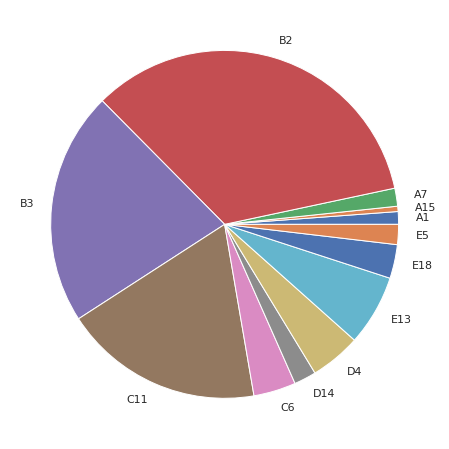

In [ ]:
dist_counts = shootings.groupby('DISTRICT').count()['INCIDENT_NUMBER']
plt.figure(figsize=(12,8))
pie(dist_counts, labels = dist_counts.index)

### Top 10 Streets

Like part one and part two crimes, Washington St. is the street where the most Shooting had commited. We can say that that street is the most dangerous street in Boston. 

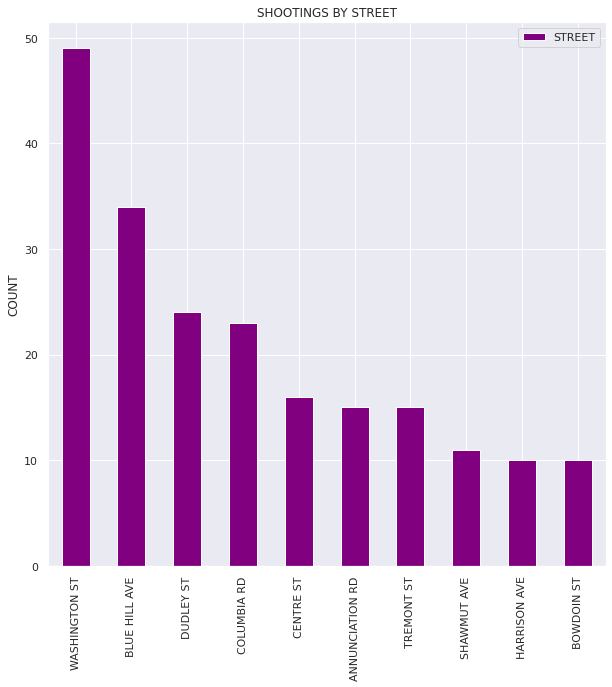

In [ ]:
fig = plt.figure(figsize=(10,10))
plt.title('SHOOTING BY STREET')
plt.ylabel('COUNT')
shootings['STREET'].value_counts()[:10].plot(kind='bar', color='purple')
plt.legend()
plt.show()

### Density Map of Shooting

In [ ]:
import plotly.express as px
fig = px.density_mapbox(shootings, lat='Lat', lon='Long', z='count', radius=10,
                        center=dict(lat=42.357791, lon=-71), zoom=10,
                        mapbox_style="stamen-terrain")
fig.show()


## GENERAL ANALYSES OF LOCATIONS

You can see crime distribution of districts over years. 
It can be said that, while B2 is significantly higher than the other districts, A15 is experiencing the least in all years. 

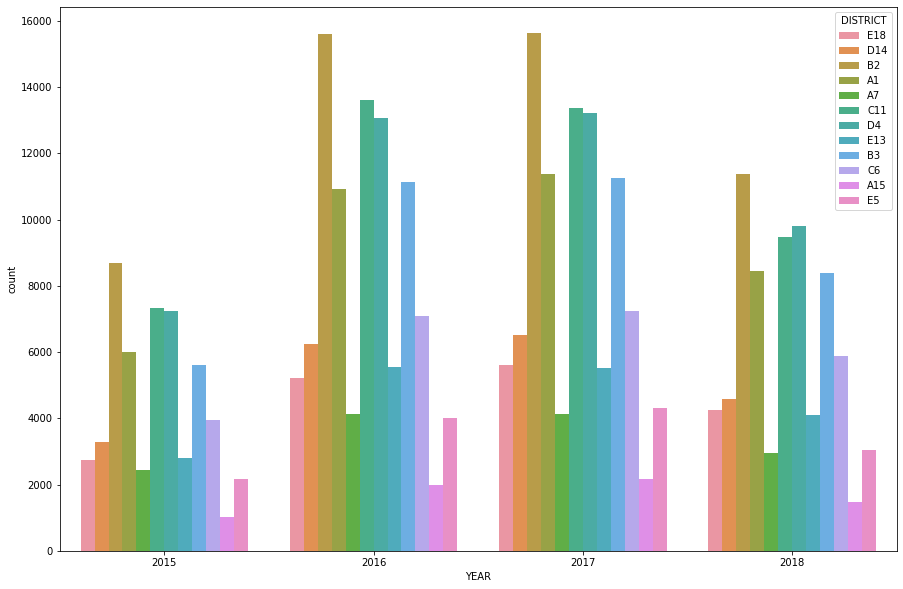

In [ ]:
plt.figure(figsize=(15,10))
sns.countplot("YEAR", hue=df["DISTRICT"], data = df)

To avoid errors caused by NaN (null) values in 'Lat' and 'Long' fields, I runned the codes below.

In [ ]:
df.Lat.replace(-1, None, inplace=True)
df.Long.replace(-1, None, inplace=True)


In [ ]:
df = df.loc[df['DISTRICT'] != 'N']
df = df.loc[df['DISTRICT'].isnull() != True]
df = df.loc[df['Lat'] != 'N']
df = df.loc[df['Long'] != 'N']

District Map

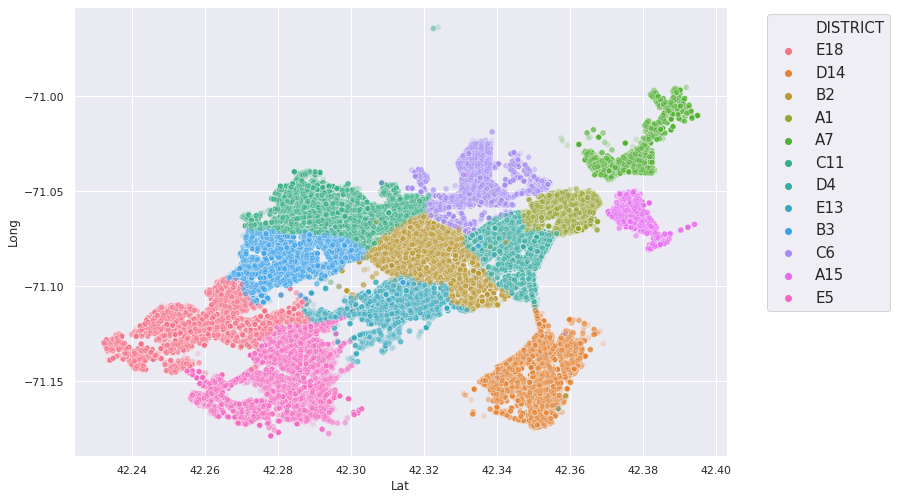

In [ ]:
a4_dims = (11.7, 8.27)
fig, ax = plt.subplots(figsize=a4_dims)
sns.scatterplot(x='Lat',
               y='Long',
                hue='DISTRICT',
                alpha=0.2,
               data=df, ax=ax)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, fontsize=15)

To get the density map of crimes based on location, I added a new column called 'count'. 

In [ ]:
df['count']= df.groupby('Location')['Location'].transform('count')

The map shows the crime density in Boston. 


In [ ]:
import plotly.express as px
fig = px.density_mapbox(df, lat='Lat', lon='Long', z='count', radius=10,
                        center=dict(lat=42.357791, lon=-71), zoom=10,
                        mapbox_style="stamen-terrain")
fig.show()

STREET

These are the top 10 streets where the highest number of crimes have taken place. Here, 'N' label has been used for columns where no street was mentioned. WASHINGTON ST experienced the highest number of incidents in this dataset

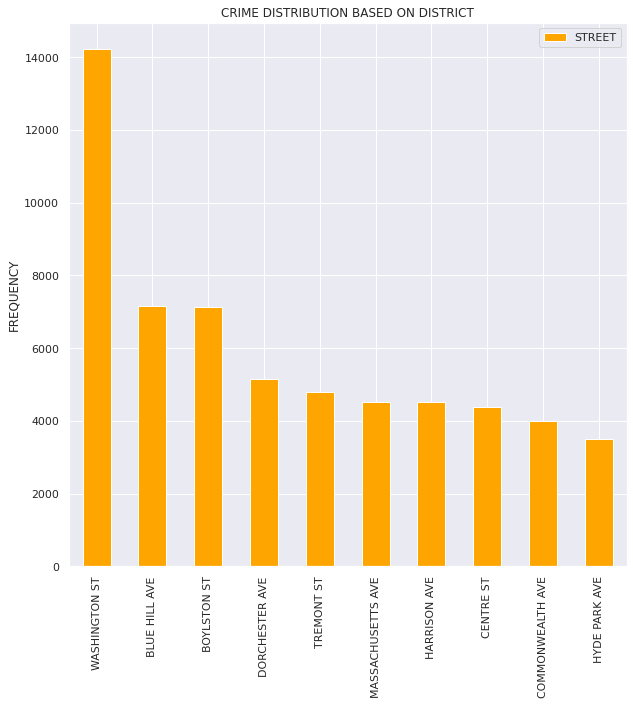

In [ ]:
fig = plt.figure(figsize=(10,10))
plt.title('CRIME DISTRIBUTION BASED ON DISTRICT')
plt.ylabel('FREQUENCY')
df['STREET'].value_counts()[:10].plot(kind='bar', color='orange')
plt.legend()
plt.show()